In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import scipy.misc

In [6]:
def getUndistortedImage(img, nx = 9, ny = 6):
    
    imgDup = np.copy(img)
    gray = cv2.cvtColor(imgDup, cv2.COLOR_RGB2GRAY)
    objPoints = []
    imgPoints = []
    
    objPointsDetected = np.zeros((nx * ny, 3), np.float32)
    objPointsDetected[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        objPoints.append(objPointsDetected)
        imgPoints.append(corners)
        cv2.drawChessboardCorners(imgDup, (nx, ny), corners, ret)
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)
        return cv2.undistort(img, mtx, dist, None, mtx)
    else:
        return -1

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [142 142 150]
  [142 142 150]
  [143 143 151]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [142 142 151]
  [143 143 151]
  [143 143 151]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [142 142 152]
  [143 143 152]
  [143 143 151]]

 ..., 
 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [125 125 125]
  [125 125 125]
  [125 125 125]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [125 125 125]
  [125 125 125]
  [125 125 125]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ..., 
  [125 125 125]
  [125 125 125]
  [125 125 125]]]
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ..., 
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ..., 
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ..., 
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ..., 
 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ..., 
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ..., 
  [0 0 0]
  [0 0 0]
  [0 0 0]]



[[[120 120 122]
  [122 122 124]
  [123 123 125]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[123 123 125]
  [123 123 125]
  [123 123 125]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[123 123 125]
  [123 123 125]
  [124 124 126]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ..., 
 [[120 119 124]
  [121 120 124]
  [122 122 124]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[121 121 124]
  [122 122 124]
  [122 122 125]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[122 121 124]
  [122 121 125]
  [122 121 126]
  ..., 
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]


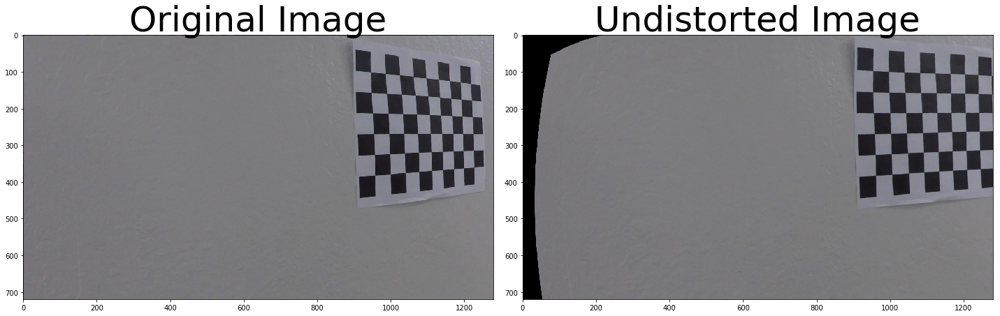

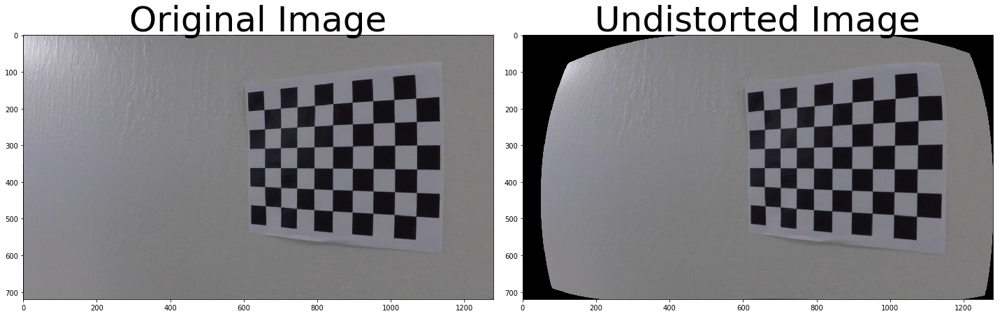

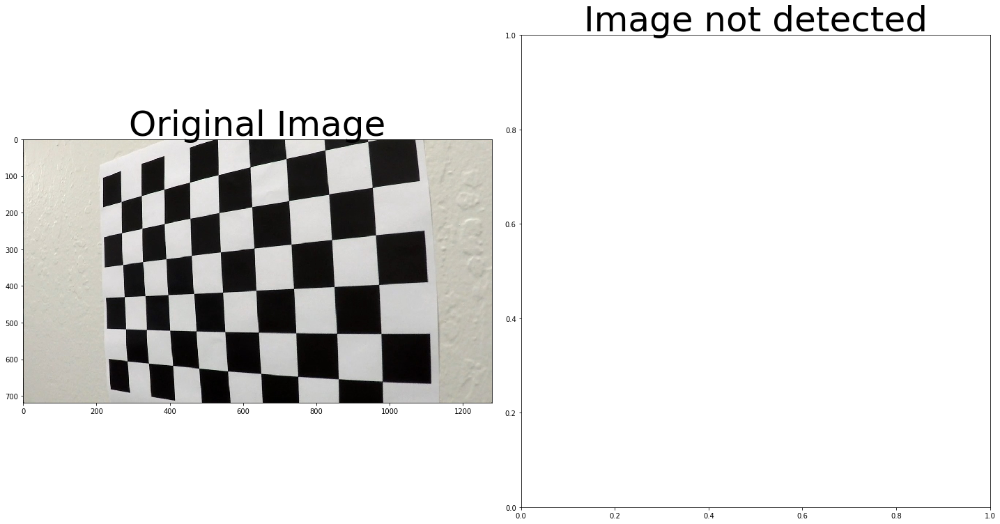

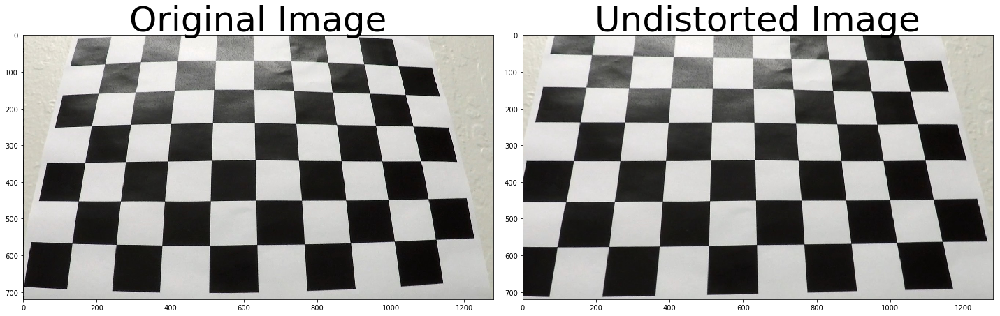

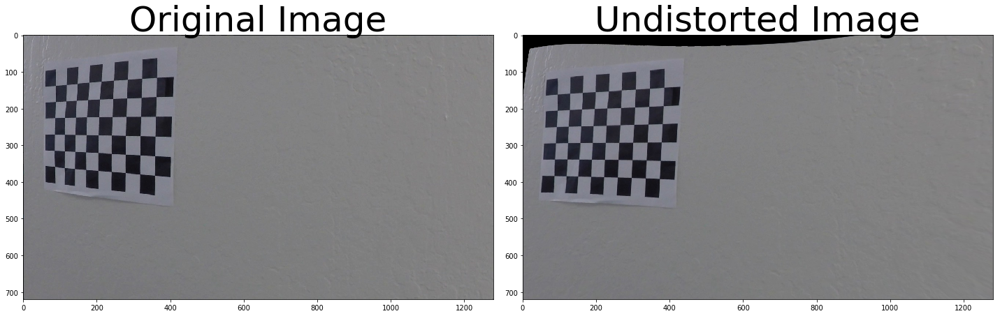

...

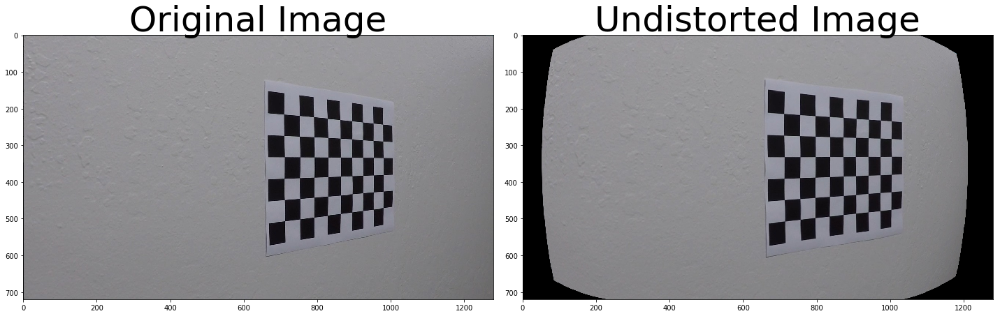

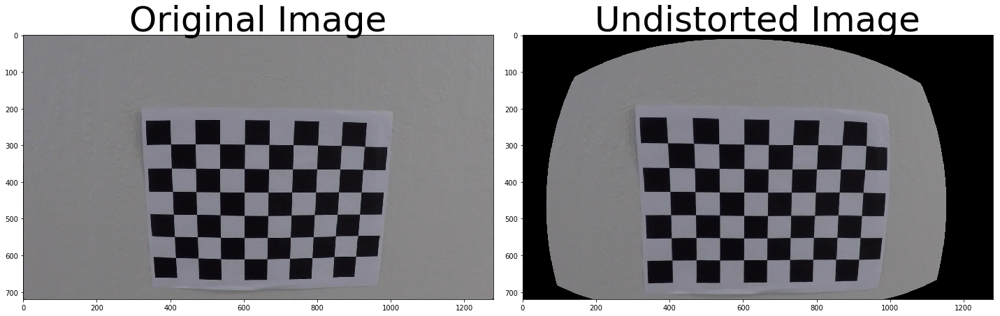

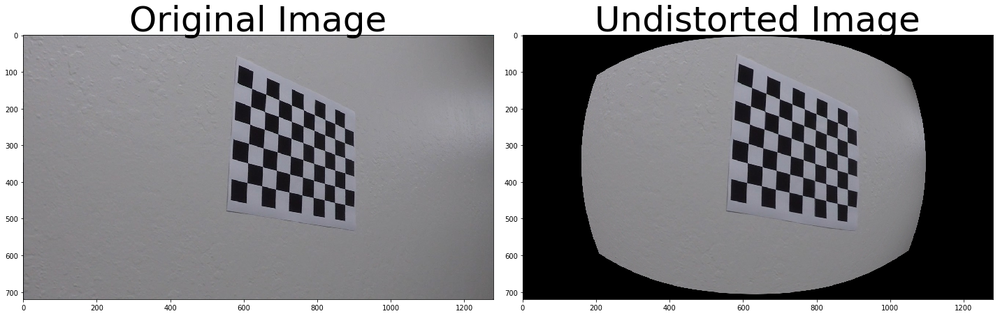

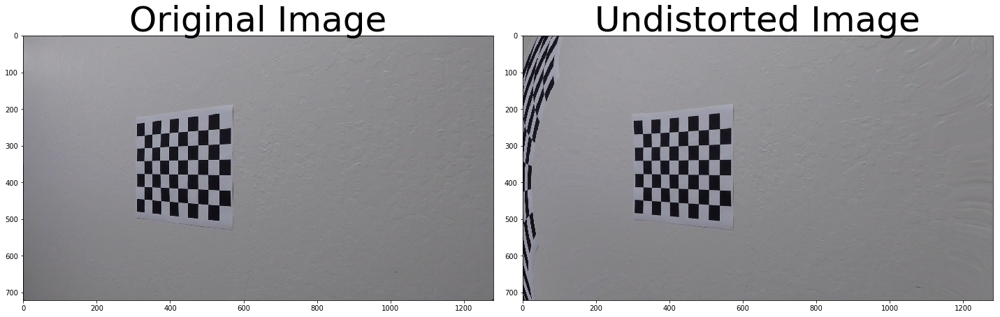

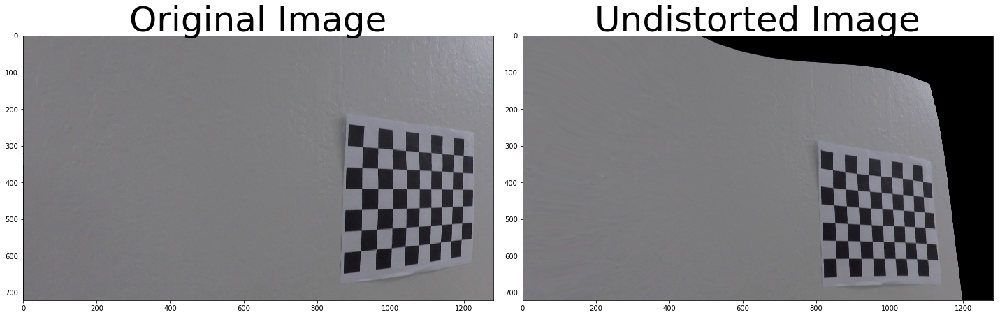

In [7]:
path = "camera_cal/"
chessImageStrings = os.listdir(path)
for chessImage in chessImageStrings:
    image = mpimg.imread(path + chessImage)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    
    undistortedImage = getUndistortedImage(image)
    print(undistortedImage)
    if isinstance(undistortedImage, np.ndarray):
        ax2.imshow(undistortedImage)
        ax2.set_title('Undistorted Image', fontsize=50)
    else:
        ax2.set_title('Image not detected', fontsize=50)

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  